Disclaimer: This is an implementation from scratch of YoloV1 model [using this tutorial](https://www.youtube.com/watch?v=n9_XyCGr-MI) on a custom dataset in Kaggle. I wanted to show how to implement the code from this video on a dataset in Kaggle. If you have any confusion when looking through this code, I would highly recommend you watching this video. I have added predictions on the test set now with version 2 of the notebook. Hope you enjoy! :)

In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive/

/content/drive/MyDrive


In [ ]:
%cd data

/content/drive/MyDrive/data


In [ ]:
!curl -L "https://app.roboflow.com/ds/<YOUR_API>" > roboflow.zip; unzip -n roboflow.zip;

# !curl -L "https://app.roboflow.com/ds/<YOUR_API>" > roboflow.zip; unzip -n roboflow.zip;

Streaming output truncated to the last 5000 lines.
 extracting: train/blighted-potatoe-leave_jpg.rf.96046e493c20ad1c286303fddf27bffe.xml  
 extracting: train/bnX8Q_jpg.rf.350ee5fc72b0d1d45fe4d24be912708b.jpg  
 extracting: train/bnX8Q_jpg.rf.350ee5fc72b0d1d45fe4d24be912708b.xml  
 extracting: train/brown-circular-spots-with-concentric-rings_jpg.rf.e3a55ed681ae26254751034e2cf1955b.jpg  
 extracting: train/brown-circular-spots-with-concentric-rings_jpg.rf.e3a55ed681ae26254751034e2cf1955b.xml  
 extracting: train/brown-concentric-rings-with-chlorotic-and-necrotic-patches_jpg.rf.29f5a0b4b750cfc32b275980a268da37.jpg  
 extracting: train/brown-concentric-rings-with-chlorotic-and-necrotic-patches_jpg.rf.29f5a0b4b750cfc32b275980a268da37.xml  
 extracting: train/brown-spot-with-shot-hole-symptom_jpg.rf.c98bce3f137205f4d5dae60402b1c016.jpg  
 extracting: train/brown-spot-with-shot-hole-symptom_jpg.rf.c98bce3f137205f4d5dae60402b1c016.xml  
 extracting: train/c1155734-e016-4eb0-9e51-8af5fb0ce526_j

In [ ]:
%cd ..

/content/drive/MyDrive


In [ ]:
%cd yolov1-models

/content/drive/MyDrive/yolov1-models


In [ ]:
# !rm -r /content/drive/MyDrive/data/

* **How does the yolov1 works?**

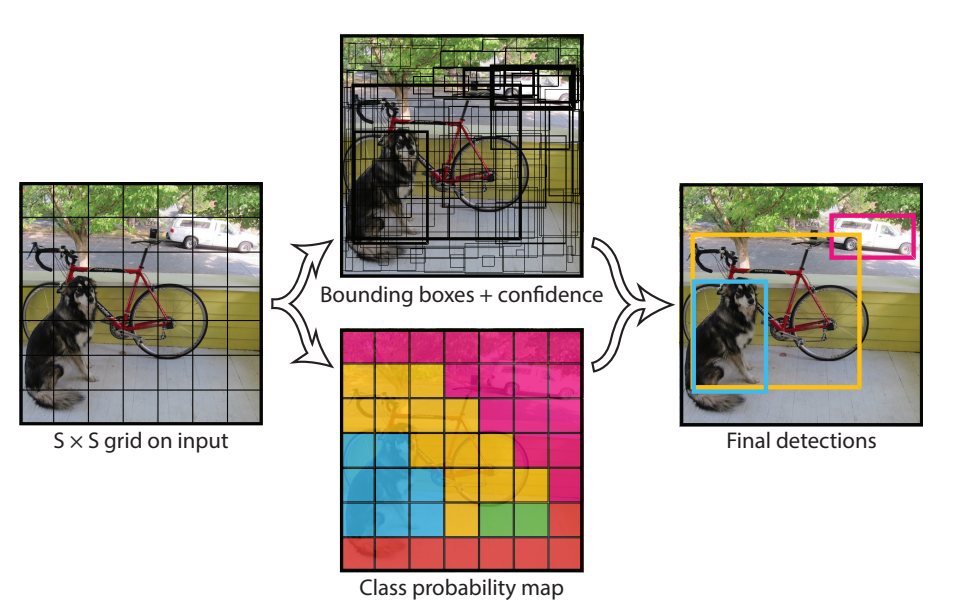

# **Import Libraries**

In [ ]:
import torch
import torch.nn as nn
import pandas as pd
import os
import PIL
import skimage
from skimage import io
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torchvision.transforms as transforms
import torch.optim as optim
import torchvision.transforms.functional as FT
from torch.utils.data import DataLoader
from tqdm import tqdm
seed = 123
import cv2
import xml.etree.ElementTree as ET
torch.manual_seed(seed)
from collections import Counter

# **Model Architecture**

In [ ]:
architecture_config = [
    #Tuple: (kernel_size, number of filters, strides, padding)
    (7, 64, 2, 3),
    #"M" = Max Pool Layer
    "M",
    (3, 192, 1, 1),
    "M",
    (1, 128, 1, 0),
    (3, 256, 1, 1),
    (1, 256, 1, 0),
    (3, 512, 1, 1),
    "M",
    #List: [(tuple), (tuple), how many times to repeat]
    [(1, 256, 1, 0), (3, 512, 1, 1), 4],
    (1, 512, 1, 0),
    (3, 1024, 1, 1),
    "M",
    [(1, 512, 1, 0), (3, 1024, 1, 1), 2],
    (3, 1024, 1, 1),
    (3, 1024, 2, 1),
    (3, 1024, 1, 1),
    (3, 1024, 1, 1),
    #Doesnt include fc layers
]

In [ ]:
class CNNBlock(nn.Module):
    def __init__(self, in_channels, out_channels, **kwargs):
        super(CNNBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, bias=False, **kwargs)
        self.batchnorm = nn.BatchNorm2d(out_channels)
        self.leakyrelu = nn.LeakyReLU(0.1)

    def forward(self, x):
        return self.leakyrelu(self.batchnorm(self.conv(x)))

class YoloV1(nn.Module):
    def __init__(self, in_channels=3, **kwargs):
        super(YoloV1, self).__init__()
        self.architecture = architecture_config
        self.in_channels = in_channels
        self.darknet = self._create_conv_layers(self.architecture)
        self.fcs = self._create_fcs(**kwargs)

    def forward(self, x):
        x = self.darknet(x)
        return self.fcs(torch.flatten(x, start_dim=1))

    def _create_conv_layers(self, architecture):
        layers = []
        in_channels = self.in_channels

        for x in architecture:
            if type(x) == tuple:
                layers += [CNNBlock(in_channels, x[1], kernel_size=x[0], stride=x[2], padding=x[3])]
                in_channels = x[1]
            elif type(x) == str:
                layers += [nn.MaxPool2d(kernel_size=2, stride=2)]
            elif type(x) == list:
                conv1 = x[0] #Tuple
                conv2 = x[1] #Tuple
                repeats = x[2] #Int

                for _ in range(repeats):
                    layers += [CNNBlock(in_channels, conv1[1], kernel_size=conv1[0], stride=conv1[2], padding=conv1[3])]
                    layers += [CNNBlock(conv1[1], conv2[1], kernel_size=conv2[0], stride=conv2[2], padding=conv2[3])]
                    in_channels = conv2[1]

        return nn.Sequential(*layers)

    def _create_fcs(self, split_size, num_boxes, num_classes):
        S, B, C = split_size, num_boxes, num_classes
        return nn.Sequential(nn.Flatten(), nn.Linear(1024 * S * S, 496), nn.Dropout(0.0), nn.LeakyReLU(0.1), nn.Linear(496, S * S * (C + B * 5)))#Original paper uses nn.Linear(1024 * S * S, 4096) not 496. Also the last layer will be reshaped to (S, S, 13) where C+B*5 = 13

# **Utility Functions**

# **Intersection Over Union**

In [ ]:
def intersection_over_union(boxes_preds, boxes_labels, box_format='midpoint'):
    """
    Calculates intersection over union

    Parameters:
        boxes_preds (tensor): Predictions of Bounding Boxes (BATCH_SIZE, 4)
        boxes_labels (tensor): Correct labels of Bounding Boxes (BATCH_SIZE, 4)
        box_format (str): midpoint/corners, if boxes are (x,y,w,h) or (x1,y1,x2,y2) respectively.

    Returns:
        tensor: Intersection over union for all examples
    """
    # boxes_preds shape is (N, 4) where N is the number of bboxes
    #boxes_labels shape is (n, 4)

    if box_format == 'midpoint':
        box1_x1 = boxes_preds[..., 0:1] - boxes_preds[..., 2:3] / 2
        box1_y1 = boxes_preds[..., 1:2] - boxes_preds[..., 3:4] / 2
        box1_x2 = boxes_preds[..., 0:1] + boxes_preds[..., 2:3] / 2
        box1_y2 = boxes_preds[..., 1:2] + boxes_preds[..., 3:4] / 2
        box2_x1 = boxes_labels[..., 0:1] - boxes_labels[..., 2:3] / 2
        box2_y1 = boxes_labels[..., 1:2] - boxes_labels[..., 3:4] / 2
        box2_x2 = boxes_labels[..., 0:1] + boxes_labels[..., 2:3] / 2
        box2_y2 = boxes_labels[..., 1:2] + boxes_labels[..., 3:4] / 2

    if box_format == 'corners':
        box1_x1 = boxes_preds[..., 0:1]
        box1_y1 = boxes_preds[..., 1:2]
        box1_x2 = boxes_preds[..., 2:3]
        box1_y2 = boxes_preds[..., 3:4] # Output tensor should be (N, 1). If we only use 3, we go to (N)
        box2_x1 = boxes_labels[..., 0:1]
        box2_y1 = boxes_labels[..., 1:2]
        box2_x2 = boxes_labels[..., 2:3]
        box2_y2 = boxes_labels[..., 3:4]

    x1 = torch.max(box1_x1, box2_x1)
    y1 = torch.max(box1_y1, box2_y1)
    x2 = torch.min(box1_x2, box2_x2)
    y2 = torch.min(box1_y2, box2_y2)

    #.clamp(0) is for the case when they don't intersect. Since when they don't intersect, one of these will be negative so that should become 0
    intersection = (x2 - x1).clamp(0) * (y2 - y1).clamp(0)

    box1_area = abs((box1_x2 - box1_x1) * (box1_y2 - box1_y1))
    box2_area = abs((box2_x2 - box2_x1) * (box2_y2 - box2_y1))

    return intersection / (box1_area + box2_area - intersection + 1e-6)

# **Non-Max Supression**

In [ ]:
def non_max_suppression(bboxes, iou_threshold, threshold, box_format="corners"):
    """
    Does Non Max Suppression given bboxes
    Parameters:
        bboxes (list): list of lists containing all bboxes with each bboxes
        specified as [class_pred, prob_score, x1, y1, x2, y2]
        iou_threshold (float): threshold where predicted bboxes is correct
        threshold (float): threshold to remove predicted bboxes (independent of IoU)
        box_format (str): "midpoint" or "corners" used to specify bboxes
    Returns:
        list: bboxes after performing NMS given a specific IoU threshold
    """

    assert type(bboxes) == list

    bboxes = [box for box in bboxes if box[1] > threshold]
    bboxes = sorted(bboxes, key=lambda x: x[1], reverse=True)
    bboxes_after_nms = []

    while bboxes:
        chosen_box = bboxes.pop(0)

        bboxes = [
            box
            for box in bboxes
            if box[0] != chosen_box[0]
            or intersection_over_union(
                torch.tensor(chosen_box[2:]),
                torch.tensor(box[2:]),
                box_format=box_format,
            )
            < iou_threshold
        ]

        bboxes_after_nms.append(chosen_box)

    return bboxes_after_nms

# **Mean Average Precision**

In [ ]:
def mean_average_precision(
    pred_boxes, true_boxes, iou_threshold=0.5, box_format="midpoint", num_classes=20
):
    """
    Calculates mean average precision
    Parameters:
        pred_boxes (list): list of lists containing all bboxes with each bboxes
        specified as [train_idx, class_prediction, prob_score, x1, y1, x2, y2]
        true_boxes (list): Similar as pred_boxes except all the correct ones
        iou_threshold (float): threshold where predicted bboxes is correct
        box_format (str): "midpoint" or "corners" used to specify bboxes
        num_classes (int): number of classes
    Returns:
        float: mAP value across all classes given a specific IoU threshold
    """

    # list storing all AP for respective classes
    average_precisions = []

    # used for numerical stability later on
    epsilon = 1e-6

    for c in range(num_classes):
        detections = []
        ground_truths = []

        # Go through all predictions and targets,
        # and only add the ones that belong to the
        # current class c
        for detection in pred_boxes:
            if detection[1] == c:
                detections.append(detection)

        for true_box in true_boxes:
            if true_box[1] == c:
                ground_truths.append(true_box)

        # find the amount of bboxes for each training example
        # Counter here finds how many ground truth bboxes we get
        # for each training example, so let's say img 0 has 3,
        # img 1 has 5 then we will obtain a dictionary with:
        # amount_bboxes = {0:3, 1:5}
        amount_bboxes = Counter([gt[0] for gt in ground_truths])

        # We then go through each key, val in this dictionary
        # and convert to the following (w.r.t same example):
        # ammount_bboxes = {0:torch.tensor[0,0,0], 1:torch.tensor[0,0,0,0,0]}
        for key, val in amount_bboxes.items():
            amount_bboxes[key] = torch.zeros(val)

        # sort by box probabilities which is index 2
        detections.sort(key=lambda x: x[2], reverse=True)
        TP = torch.zeros((len(detections)))
        FP = torch.zeros((len(detections)))
        total_true_bboxes = len(ground_truths)

        # If none exists for this class then we can safely skip
        if total_true_bboxes == 0:
            continue

        for detection_idx, detection in enumerate(detections):
            # Only take out the ground_truths that have the same
            # training idx as detection
            ground_truth_img = [
                bbox for bbox in ground_truths if bbox[0] == detection[0]
            ]

            num_gts = len(ground_truth_img)
            best_iou = 0

            for idx, gt in enumerate(ground_truth_img):
                iou = intersection_over_union(
                    torch.tensor(detection[3:]),
                    torch.tensor(gt[3:]),
                    box_format=box_format,
                )

                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = idx

            if best_iou > iou_threshold:
                # only detect ground truth detection once
                if amount_bboxes[detection[0]][best_gt_idx] == 0:
                    # true positive and add this bounding box to seen
                    TP[detection_idx] = 1
                    amount_bboxes[detection[0]][best_gt_idx] = 1
                else:
                    FP[detection_idx] = 1

            # if IOU is lower then the detection is a false positive
            else:
                FP[detection_idx] = 1

        TP_cumsum = torch.cumsum(TP, dim=0)
        FP_cumsum = torch.cumsum(FP, dim=0)
        recalls = TP_cumsum / (total_true_bboxes + epsilon)
        precisions = torch.divide(TP_cumsum, (TP_cumsum + FP_cumsum + epsilon))
        precisions = torch.cat((torch.tensor([1]), precisions))
        recalls = torch.cat((torch.tensor([0]), recalls))
        # torch.trapz for numerical integration
        average_precisions.append(torch.trapz(precisions, recalls))

    return sum(average_precisions) / len(average_precisions)

# **Last Utility Functions**

In [ ]:
def get_bboxes(
    loader,
    model,
    iou_threshold,
    threshold,
    pred_format="cells",
    box_format="midpoint",
    device="cuda",
):
    all_pred_boxes = []
    all_true_boxes = []

    # make sure model is in eval before get bboxes
    model.eval()
    train_idx = 0

    for batch_idx, (x, labels) in enumerate(loader):
        x = x.to(device)
        labels = labels.to(device)

        with torch.no_grad():
            predictions = model(x)

        batch_size = x.shape[0]
        true_bboxes = cellboxes_to_boxes(labels)
        bboxes = cellboxes_to_boxes(predictions)

        for idx in range(batch_size):
            nms_boxes = non_max_suppression(
                bboxes[idx],
                iou_threshold=iou_threshold,
                threshold=threshold,
                box_format=box_format,
            )


            #if batch_idx == 0 and idx == 0:
            #    plot_image(x[idx].permute(1,2,0).to("cpu"), nms_boxes)
            #    print(nms_boxes)

            for nms_box in nms_boxes:
                all_pred_boxes.append([train_idx] + nms_box)

            for box in true_bboxes[idx]:
                # many will get converted to 0 pred
                if box[1] > threshold:
                    all_true_boxes.append([train_idx] + box)

            train_idx += 1

    model.train()
    return all_pred_boxes, all_true_boxes



def convert_cellboxes(predictions, S=7, C=3):
    """
    Converts bounding boxes output from Yolo with
    an image split size of S into entire image ratios
    rather than relative to cell ratios. Tried to do this
    vectorized, but this resulted in quite difficult to read
    code... Use as a black box? Or implement a more intuitive,
    using 2 for loops iterating range(S) and convert them one
    by one, resulting in a slower but more readable implementation.
    """

    predictions = predictions.to("cpu")
    batch_size = predictions.shape[0]
    predictions = predictions.reshape(batch_size, 7, 7, C + 10)
    bboxes1 = predictions[..., C + 1:C + 5]
    bboxes2 = predictions[..., C + 6:C + 10]
    scores = torch.cat(
        (predictions[..., C].unsqueeze(0), predictions[..., C + 5].unsqueeze(0)), dim=0
    )
    best_box = scores.argmax(0).unsqueeze(-1)
    best_boxes = bboxes1 * (1 - best_box) + best_box * bboxes2
    cell_indices = torch.arange(7).repeat(batch_size, 7, 1).unsqueeze(-1)
    x = 1 / S * (best_boxes[..., :1] + cell_indices)
    y = 1 / S * (best_boxes[..., 1:2] + cell_indices.permute(0, 2, 1, 3))
    w_y = 1 / S * best_boxes[..., 2:4]
    converted_bboxes = torch.cat((x, y, w_y), dim=-1)
    predicted_class = predictions[..., :C].argmax(-1).unsqueeze(-1)
    best_confidence = torch.max(predictions[..., C], predictions[..., C + 5]).unsqueeze(
        -1
    )
    converted_preds = torch.cat(
        (predicted_class, best_confidence, converted_bboxes), dim=-1
    )

    return converted_preds


def cellboxes_to_boxes(out, S=7):
    converted_pred = convert_cellboxes(out).reshape(out.shape[0], S * S, -1)
    converted_pred[..., 0] = converted_pred[..., 0].long()
    all_bboxes = []

    for ex_idx in range(out.shape[0]):
        bboxes = []

        for bbox_idx in range(S * S):
            bboxes.append([x.item() for x in converted_pred[ex_idx, bbox_idx, :]])
        all_bboxes.append(bboxes)

    return all_bboxes

def save_checkpoint(state, filename="my_checkpoint.pth"):
    print("=> Saving checkpoint")
    torch.save(state, filename)

def load_checkpoint(checkpoint, model, optimizer):
    print("=> Loading checkpoint")
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

# **Dataset Preprocessing**

In [ ]:
files_dir = '/content/drive/MyDrive/data/train'
valid_dir = '/content/drive/MyDrive/data/valid'
test_dir = '/content/drive/MyDrive/data/test'


images = [image for image in sorted(os.listdir(files_dir))
                        if image[-4:]=='.jpg']
annots = []
for image in images:
    annot = image[:-4] + '.xml'
    annots.append(annot)

images = pd.Series(images, name='images')
annots = pd.Series(annots, name='annots')
df = pd.concat([images, annots], axis=1)
df = pd.DataFrame(df)

test_images = [image for image in sorted(os.listdir(test_dir))
                        if image[-4:]=='.jpg']

test_annots = []
for image in test_images:
    annot = image[:-4] + '.xml'
    test_annots.append(annot)

test_images = pd.Series(test_images, name='test_images')
test_annots = pd.Series(test_annots, name='test_annots')
test_df = pd.concat([test_images, test_annots], axis=1)
test_df = pd.DataFrame(test_df)


# Process valid images
valid_images = [image for image in sorted(os.listdir(valid_dir)) if image.endswith('.jpg')]
valid_annots = [image[:-4] + '.xml' for image in valid_images]

valid_images_series = pd.Series(valid_images, name='valid_images')
valid_annots_series = pd.Series(valid_annots, name='valid_annots')
valid_df = pd.DataFrame({'valid_images': valid_images_series, 'valid_annots': valid_annots_series})

In [ ]:
class TomatoDiseasesImagesDataset(torch.utils.data.Dataset):
    def __init__(self, df, files_directory, S=7, B=2, C=3, transform=None):
        self.annotations = df
        self.files_dir = files_directory
        self.transform = transform
        self.S = S
        self.B = B
        self.C = C

    def __len__(self):
        return len(self.annotations)

    def __getitem__(self, index):
        label_path = os.path.join(self.files_dir, self.annotations.iloc[index, 1])
        boxes = []
        tree = ET.parse(label_path)
        root = tree.getroot()

        # class_dictionary = {'apple':0, 'banana':1, 'orange':2}
        class_dictionary = {
          'Early Blight': 0,
          'Healthy' : 1,
          'Late Blight': 2,
          'Leaf Miner': 3,
          'Leaf Mold': 4,
          'Mosaic Virus': 5,
          'Septoria': 6,
          'Spider Mites': 7,
          'Yellow Leaf Curl Virus': 8
         }

        if(int(root.find('size').find('height').text) == 0):
            filename = root.find('filename').text
            img = Image.open(self.files_dir + '/' + filename)
            img_width, img_height = img.size

            for member in root.findall('object'):

                klass = member.find('name').text
                klass = class_dictionary[klass]

                # bounding box
                xmin = int(member.find('bndbox').find('xmin').text)
                xmax = int(member.find('bndbox').find('xmax').text)

                ymin = int(member.find('bndbox').find('ymin').text)
                ymax = int(member.find('bndbox').find('ymax').text)

                centerx = ((xmax + xmin) / 2) / img_width
                centery = ((ymax + ymin) / 2) / img_height
                boxwidth = (xmax - xmin) / img_width
                boxheight = (ymax - ymin) / img_height


                boxes.append([klass, centerx, centery, boxwidth, boxheight])

        elif(int(root.find('size').find('height').text) != 0):

            for member in root.findall('object'):

                klass = member.find('name').text
                klass = class_dictionary[klass]

                                # bounding box
                xmin = int(member.find('bndbox').find('xmin').text)
                xmax = int(member.find('bndbox').find('xmax').text)
                img_width = int(root.find('size').find('width').text)

                ymin = int(member.find('bndbox').find('ymin').text)
                ymax = int(member.find('bndbox').find('ymax').text)
                img_height = int(root.find('size').find('height').text)

                centerx = ((xmax + xmin) / 2) / img_width
                centery = ((ymax + ymin) / 2) / img_height
                boxwidth = (xmax - xmin) / img_width
                boxheight = (ymax - ymin) / img_height


                boxes.append([klass, centerx, centery, boxwidth, boxheight])


        boxes = torch.tensor(boxes)
        img_path = os.path.join(self.files_dir, self.annotations.iloc[index, 0])
        image = Image.open(img_path)
        image = image.convert("RGB")

        if self.transform:
            # image = self.transform(image)
            image, boxes = self.transform(image, boxes)

        # Convert To Cells
        label_matrix = torch.zeros((self.S, self.S, self.C + 5 * self.B))
        for box in boxes:
            class_label, x, y, width, height = box.tolist()
            class_label = int(class_label)

            # i,j represents the cell row and cell column
            i, j = int(self.S * y), int(self.S * x)
            x_cell, y_cell = self.S * x - j, self.S * y - i

            """
            Calculating the width and height of cell of bounding box,
            relative to the cell is done by the following, with
            width as the example:

            width_pixels = (width*self.image_width)
            cell_pixels = (self.image_width)

            Then to find the width relative to the cell is simply:
            width_pixels/cell_pixels, simplification leads to the
            formulas below.
            """
            width_cell, height_cell = (
                width * self.S,
                height * self.S,
            )

            # If no object already found for specific cell i,j
            # Note: This means we restrict to ONE object
            # per cell!
#             print(i, j)
            if label_matrix[i, j, self.C] == 0:
                # Set that there exists an object
                label_matrix[i, j, self.C] = 1

                # Box coordinates
                box_coordinates = torch.tensor(
                    [x_cell, y_cell, width_cell, height_cell]
                )

                label_matrix[i, j, 4:8] = box_coordinates

                # Set one hot encoding for class_label
                label_matrix[i, j, class_label] = 1

        return image, label_matrix


# **Model Loss**

In [ ]:
class YoloLoss(nn.Module):
    """
    Calculate the loss for yolo (v1) model
    """

    def __init__(self, S=7, B=2, C=3):
        super(YoloLoss, self).__init__()
        self.mse = nn.MSELoss(reduction="sum")

        """
        S is split size of image (in paper 7),
        B is number of boxes (in paper 2),
        C is number of classes (in paper 20, in dataset 3),
        """
        self.S = S
        self.B = B
        self.C = C

        # These are from Yolo paper, signifying how much we should
        # pay loss for no object (noobj) and the box coordinates (coord)
        self.lambda_noobj = 0.5
        self.lambda_coord = 5

    def forward(self, predictions, target):
        # predictions are shaped (BATCH_SIZE, S*S(C+B*5) when inputted
        predictions = predictions.reshape(-1, self.S, self.S, self.C + self.B * 5)

        # Calculate IoU for the two predicted bounding boxes with target bbox
        iou_b1 = intersection_over_union(predictions[..., self.C + 1:self.C + 5], target[..., self.C + 1:self.C + 5])
        iou_b2 = intersection_over_union(predictions[..., self.C + 6:self.C + 10], target[..., self.C + 1:self.C + 5])
        ious = torch.cat([iou_b1.unsqueeze(0), iou_b2.unsqueeze(0)], dim=0)

        # Take the box with highest IoU out of the two prediction
        # Note that bestbox will be indices of 0, 1 for which bbox was best
        iou_maxes, bestbox = torch.max(ious, dim=0)
        exists_box = target[..., self.C].unsqueeze(3)  # in paper this is Iobj_i

        # ======================== #
        #   FOR BOX COORDINATES    #
        # ======================== #

        # Set boxes with no object in them to 0. We only take out one of the two
        # predictions, which is the one with highest Iou calculated previously.
        box_predictions = exists_box * (
            (
                bestbox * predictions[..., self.C + 6:self.C + 10]
                + (1 - bestbox) * predictions[..., self.C + 1:self.C + 5]
            )
        )

        box_targets = exists_box * target[..., self.C + 1:self.C + 5]

        # Take sqrt of width, height of boxes to ensure that
        box_predictions[..., 2:4] = torch.sign(box_predictions[..., 2:4]) * torch.sqrt(
            torch.abs(box_predictions[..., 2:4] + 1e-6)
        )
        box_targets[..., 2:4] = torch.sqrt(box_targets[..., 2:4])

        box_loss = self.mse(
            torch.flatten(box_predictions, end_dim=-2),
            torch.flatten(box_targets, end_dim=-2),
        )

        # ==================== #
        #   FOR OBJECT LOSS    #
        # ==================== #

        # pred_box is the confidence score for the bbox with highest IoU
        pred_box = (
            bestbox * predictions[..., self.C + 5:self.C + 6] + (1 - bestbox) * predictions[..., self.C:self.C + 1]
        )

        object_loss = self.mse(
            torch.flatten(exists_box * pred_box),
            torch.flatten(exists_box * target[..., self.C:self.C + 1]),
        )

        # ======================= #
        #   FOR NO OBJECT LOSS    #
        # ======================= #

        #max_no_obj = torch.max(predictions[..., 20:21], predictions[..., 25:26])
        #no_object_loss = self.mse(
        #    torch.flatten((1 - exists_box) * max_no_obj, start_dim=1),
        #    torch.flatten((1 - exists_box) * target[..., 20:21], start_dim=1),
        #)

        no_object_loss = self.mse(
            torch.flatten((1 - exists_box) * predictions[..., self.C:self.C + 1], start_dim=1),
            torch.flatten((1 - exists_box) * target[..., self.C:self.C + 1], start_dim=1),
        )

        no_object_loss += self.mse(
            torch.flatten((1 - exists_box) * predictions[..., self.C + 5:self.C + 6], start_dim=1),
            torch.flatten((1 - exists_box) * target[..., self.C:self.C + 1], start_dim=1)
        )

        # ================== #
        #   FOR CLASS LOSS   #
        # ================== #

        class_loss = self.mse(
            torch.flatten(exists_box * predictions[..., :self.C], end_dim=-2,),
            torch.flatten(exists_box * target[..., :self.C], end_dim=-2,),
        )

        loss = (
            self.lambda_coord * box_loss  # first two rows in paper
            + object_loss  # third row in paper
            + self.lambda_noobj * no_object_loss  # forth row
            + class_loss  # fifth row
        )

        return loss

# **Model Training**

In [ ]:
LEARNING_RATE = 2e-5
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
BATCH_SIZE = 16 # 64 in original paper but resource exhausted error otherwise.
WEIGHT_DECAY = 0
EPOCHS = 10
NUM_WORKERS = 2
PIN_MEMORY = True
LOAD_MODEL = False
LOAD_MODEL_FILE = f"yolov1_EPOCHS{EPOCHS}_model.pth"

In [ ]:
def train_fn(train_loader, model, optimizer, loss_fn):
    print("Train loader: ")
    loop = tqdm(train_loader, leave=True)
    mean_loss = []

    for batch_idx, (x, y) in enumerate(loop):
        x, y = x.to(DEVICE), y.to(DEVICE)
        out = model(x)
        loss = loss_fn(out, y)
        mean_loss.append(loss.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        loop.set_postfix(loss = loss.item())

    print(f"Mean loss was {sum(mean_loss) / len(mean_loss)}")
    return mean_loss

In [ ]:
class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, img, bboxes):
        for t in self.transforms:
            img, bboxes = t(img), bboxes

        return img, bboxes


transform = Compose([transforms.Resize((448, 448)), transforms.ToTensor()])

In [ ]:
import plotly.graph_objs as go
import plotly.express as px

def plot_losses(train_losses, eval_losses):
    epochs = list(range(1, len(train_losses) + 1))

    fig = go.Figure()

    fig.add_trace(go.Scatter(x=epochs, y=train_losses, mode='lines', name='Train Loss'))
    fig.add_trace(go.Scatter(x=epochs, y=eval_losses, mode='lines', name='Eval Loss'))

    fig.update_layout(title='Training and Evaluation Losses Over Epochs',
                      xaxis_title='Epochs',
                      yaxis_title='Loss',
                      legend=dict(x=0.7, y=0.9),
                      template='plotly_dark')

    fig.show()

In [ ]:
from tqdm import tqdm

def evaluate_model(valid_loader, model, loss_fn, iou_threshold, obj_threshold, box_format="midpoint"):
    model.eval()
    pred_boxes = []
    target_boxes = []
    eval_losses = []

    print("Validation loader: ")
    loop = tqdm(valid_loader, leave=True)  # Using tqdm for progress indication

    with torch.no_grad():
        for batch_idx, (x, y) in enumerate(loop):
            x, y = x.to(DEVICE), y.to(DEVICE)

            predictions = model(x)
            loss = loss_fn(predictions, y)
            eval_losses.append(loss.item())

            # Optional: Update the progress bar with the current average loss
            loop.set_postfix(loss=np.mean(eval_losses))

    print(f"Mean evaluation loss was {np.mean(eval_losses)}")  # Summarize mean loss after evaluation
    return eval_losses



def train_model():
    model = YoloV1(split_size=7, num_boxes=2, num_classes=3).to(DEVICE)
    optimizer = optim.Adam(
        model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY
    )
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer=optimizer, factor=0.1, patience=3, mode='max', verbose=True)
    loss_fn = YoloLoss()

    if LOAD_MODEL:
        load_checkpoint(torch.load(LOAD_MODEL_FILE), model, optimizer)

    train_dataset = TomatoDiseasesImagesDataset(
        transform=transform,
        df=df,
        files_directory=files_dir
    )

    valid_dataset = TomatoDiseasesImagesDataset(
        transform=transform,
        df=valid_df,
        files_directory=valid_dir
    )

    train_loader = DataLoader(
        dataset=train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        drop_last=False,
    )

    valid_loader = DataLoader(
        dataset=valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        drop_last=False,
    )

    train_losses = []  # List to store training losses
    eval_losses = []   # List to store evaluation losses
    mAP_scores = []   # List to store mAP scores
    eval_mAP_scores = []   # List to store mAP scores for valid set


    for epoch in range(EPOCHS):
        epoch_losses = train_fn(train_loader, model, optimizer, loss_fn)
        train_losses.extend(epoch_losses)

        pred_boxes, target_boxes = get_bboxes(
            train_loader, model, iou_threshold=0.5, threshold=0.4
        )

        mean_avg_prec = mean_average_precision(
            pred_boxes, target_boxes, iou_threshold=0.5, box_format="midpoint"
        )
        print(f"Train mAP: {mean_avg_prec}")
        mAP_scores.append(mean_avg_prec)

        # Evaluate the model
        epoch_eval_losses = evaluate_model(
            valid_loader, model, loss_fn, iou_threshold=0.5, obj_threshold=0.4
        )
        eval_losses.extend(epoch_eval_losses)

         # Assuming get_bboxes is a function you've defined to get the predicted boxes
        pred_boxes_eval, target_boxes_eval = get_bboxes(valid_loader, model, iou_threshold=0.5, threshold=0.4, box_format="midpoint")

        mean_avg_prec_eval = mean_average_precision(
            pred_boxes_eval, target_boxes_eval, iou_threshold=0.5, box_format="midpoint"
        )
        print(f"Valid mAP: {mean_avg_prec_eval}")
        eval_mAP_scores.append(mean_avg_prec_eval)

        scheduler.step(mean_avg_prec)

    checkpoint = {
            "state_dict": model.state_dict(),
            "optimizer": optimizer.state_dict(),
    }
    save_checkpoint(checkpoint, filename=LOAD_MODEL_FILE)

    plot_losses(train_losses, eval_losses)
    return model



model = train_model()

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Train loader: 


100%|██████████| 194/194 [02:46<00:00,  1.16it/s, loss=114]


Mean loss was 294.62102425958693
Train mAP: 0.040800560265779495
Validation loader: 


100%|██████████| 40/40 [00:11<00:00,  3.58it/s, loss=167]


Mean evaluation loss was 166.6670181274414
Valid mAP: 0.03500492498278618
Train loader: 


100%|██████████| 194/194 [01:42<00:00,  1.89it/s, loss=56.3]


Mean loss was 163.33462846893624
Train mAP: 0.04407205805182457
Validation loader: 


100%|██████████| 40/40 [00:11<00:00,  3.50it/s, loss=153]


Mean evaluation loss was 153.33835639953614
Valid mAP: 0.02303379774093628
Train loader: 


100%|██████████| 194/194 [01:42<00:00,  1.89it/s, loss=50.9]


Mean loss was 140.89978660504843
Train mAP: 0.0597212128341198
Validation loader: 


100%|██████████| 40/40 [00:11<00:00,  3.48it/s, loss=139]


Mean evaluation loss was 138.73551597595215
Valid mAP: 0.030776897445321083
Train loader: 


100%|██████████| 194/194 [01:43<00:00,  1.87it/s, loss=40.7]


Mean loss was 124.02229073121376
Train mAP: 0.09998015314340591
Validation loader: 


100%|██████████| 40/40 [00:11<00:00,  3.46it/s, loss=132]


Mean evaluation loss was 132.18332929611205
Valid mAP: 0.05885620415210724
Train loader: 


100%|██████████| 194/194 [01:43<00:00,  1.88it/s, loss=97.4]


Mean loss was 111.17457549104985
Train mAP: 0.09119302034378052
Validation loader: 


100%|██████████| 40/40 [00:11<00:00,  3.46it/s, loss=127]


Mean evaluation loss was 126.8549825668335
Valid mAP: 0.048641741275787354
Train loader: 


100%|██████████| 194/194 [01:43<00:00,  1.87it/s, loss=28.9]


Mean loss was 100.5147563108464
Train mAP: 0.1067633107304573
Validation loader: 


100%|██████████| 40/40 [00:11<00:00,  3.45it/s, loss=122]


Mean evaluation loss was 122.16348218917847
Valid mAP: 0.05727769806981087
Train loader: 


100%|██████████| 194/194 [01:43<00:00,  1.87it/s, loss=37.7]


Mean loss was 94.16293350691647
Train mAP: 0.15332549810409546
Validation loader: 


100%|██████████| 40/40 [00:11<00:00,  3.47it/s, loss=121]


Mean evaluation loss was 120.8364953994751
Valid mAP: 0.07224615663290024
Train loader: 


100%|██████████| 194/194 [01:43<00:00,  1.87it/s, loss=29.1]


Mean loss was 83.84140188669421
Train mAP: 0.20421665906906128
Validation loader: 


100%|██████████| 40/40 [00:11<00:00,  3.48it/s, loss=117]


Mean evaluation loss was 116.56560592651367
Valid mAP: 0.08740546554327011
Train loader: 


100%|██████████| 194/194 [01:42<00:00,  1.89it/s, loss=43.9]


Mean loss was 78.38164661840065
Train mAP: 0.1667991280555725
Validation loader: 


100%|██████████| 40/40 [00:11<00:00,  3.45it/s, loss=117]


Mean evaluation loss was 116.84380645751953
Valid mAP: 0.06456289440393448
Train loader: 


100%|██████████| 194/194 [01:42<00:00,  1.89it/s, loss=32.6]


Mean loss was 73.17106927301465
Train mAP: 0.18445523083209991
Validation loader: 


100%|██████████| 40/40 [00:11<00:00,  3.52it/s, loss=116]


Mean evaluation loss was 115.57967319488526
Valid mAP: 0.07176974415779114
=> Saving checkpoint


# **Predictions**

In [ ]:
# LOAD_MODEL = True
# EPOCHS = 1

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np
# import torchvision.transforms.functional as F
# from PIL import ImageDraw

# def visualize_predictions(image, pred_boxes, target_boxes):
#     image = F.to_pil_image(image)
#     draw = ImageDraw.Draw(image)

#     for box in pred_boxes:
#         x, y, w, h, conf, cls_pred = box
#         box = [(x - w / 2), (y - h / 2), (x + w / 2), (y + h / 2)]
#         draw.rectangle(box, outline="red", width=2)
#         draw.text((box[0], box[1]), f"Class: {cls_pred}", fill="red")

#     for box in target_boxes:
#         x, y, w, h, cls_true = box
#         box = [(x - w / 2), (y - h / 2), (x + w / 2), (y + h / 2)]
#         draw.rectangle(box, outline="green", width=2)
#         draw.text((box[0], box[1]), f"Class: {cls_true}", fill="green")

#     plt.imshow(np.array(image))
#     plt.axis('off')
#     plt.show()

In [ ]:
# Assuming you have a test dataloader similar to train and valid dataloaders
test_dataset = TomatoDiseasesImagesDataset(
    transform=transform,
    df=test_df,
    files_directory=test_dir
)

test_loader = DataLoader(
    dataset=test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,  # No need to shuffle for testing
    drop_last=False,
)


train_dataset = TomatoDiseasesImagesDataset(
    transform=transform,
    df=df,
    files_directory=files_dir
)

valid_dataset = TomatoDiseasesImagesDataset(
    transform=transform,
    df=valid_df,
    files_directory=valid_dir
)

train_loader = DataLoader(
    dataset=train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    drop_last=False,
)

valid_loader = DataLoader(
    dataset=valid_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    drop_last=False,
)

In [ ]:
import torch
import matplotlib.pyplot as plt
from torchvision import transforms

model_weight = torch.load("/content/drive/MyDrive/yolov1-models/yolov1_EPOCHS10_model.pth")
model = YoloV1(split_size=7, num_boxes=2, num_classes=3).to(DEVICE)
model.load_state_dict(model_weight['state_dict'])

<All keys matched successfully>

In [ ]:
def get_bboxes(
    loader,
    model,
    iou_threshold,
    threshold,
    pred_format="cells",
    box_format="midpoint",
    device="cuda",
    show_results=False,  # New parameter to control whether to show images with predicted bounding boxes
):
    all_pred_boxes = []
    all_true_boxes = []

    # make sure model is in eval before get bboxes
    model.eval()
    train_idx = 0

    for batch_idx, (x, labels) in enumerate(loader):
        x = x.to(device)
        labels = labels.to(device)

        with torch.no_grad():
            predictions = model(x)

        batch_size = x.shape[0]
        true_bboxes = cellboxes_to_boxes(labels)
        bboxes = cellboxes_to_boxes(predictions)

        for idx in range(batch_size):
            nms_boxes = non_max_suppression(
                bboxes[idx],
                iou_threshold=iou_threshold,
                threshold=threshold,
                box_format=box_format,
            )

            if show_results:  # Check if we need to show the results
                image = x[idx].permute(1, 2, 0).to("cpu").numpy()
                plt.figure()
                plt.imshow(image)
                current_ax = plt.gca()
                for box in nms_boxes:
                    print(box)
                    class_name, confidence, x1, y1, x2, y2 = box
                    box_width = x2 - x1
                    box_height = y2 - y1
                    current_ax.add_patch(plt.Rectangle((x1, y1), box_width, box_height, fill=False, edgecolor='r', linewidth=2))
                plt.axis('off')
                plt.show()

            for nms_box in nms_boxes:
                all_pred_boxes.append([train_idx] + nms_box)

            for box in true_bboxes[idx]:
                # many will get converted to 0 pred
                if box[1] > threshold:
                    all_true_boxes.append([train_idx] + box)

            train_idx += 1

    model.train()
    return all_pred_boxes, all_true_boxes

[2.0, 0.658682644367218, 0.5377746820449829, 0.5348622798919678, 0.7736564874649048, 0.9764819741249084]


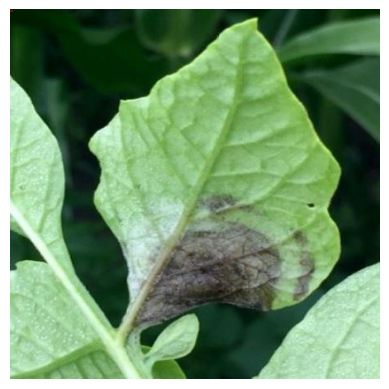

[2.0, 1.2508624792099, 0.7424901723861694, 0.7491852641105652, 0.33409276604652405, 0.3766134977340698]
[0.0, 1.1622135639190674, 0.7646294236183167, 0.23488502204418182, 0.35780420899391174, 0.38071075081825256]
[2.0, 1.062748908996582, 0.2254224717617035, 0.7852286100387573, 0.1996132880449295, 0.3645821809768677]
[2.0, 0.9580972194671631, 0.27590325474739075, 0.2500290870666504, 0.2755979895591736, 0.34968212246894836]


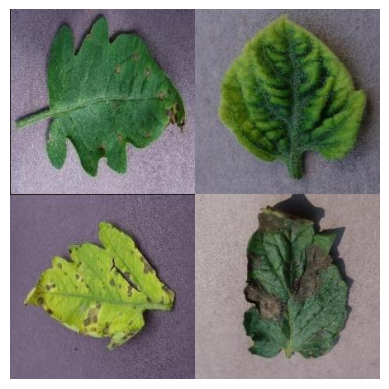

[1.0, 0.8442959189414978, 0.3906917870044708, 0.3975059688091278, 0.22355550527572632, 0.14286628365516663]
[1.0, 0.6752771139144897, 0.322894811630249, 0.489859938621521, 0.26542168855667114, 0.22607703506946564]
[1.0, 0.5963323712348938, 0.7604352831840515, 0.353557288646698, 0.31947824358940125, 0.2133668214082718]
[1.0, 0.5806989669799805, 0.29179269075393677, 0.20410805940628052, 0.18484677374362946, 0.13565193116664886]
[1.0, 0.578869104385376, 0.5459402203559875, 0.777921736240387, 0.1657804697751999, 0.28960028290748596]
[1.0, 0.5728445053100586, 0.513820469379425, 0.24253356456756592, 0.13748662173748016, 0.0965515673160553]
[1.0, 0.5441136360168457, 0.6411612033843994, 0.5836035013198853, 0.25974151492118835, 0.2070295363664627]
[1.0, 0.5271011590957642, 0.21813097596168518, 0.27213698625564575, 0.26412534713745117, 0.19929209351539612]
[1.0, 0.5215716361999512, 0.6694853901863098, 0.4719774127006531, 0.27317938208580017, 0.1515253782272339]
[1.0, 0.4434056282043457, 0.462270

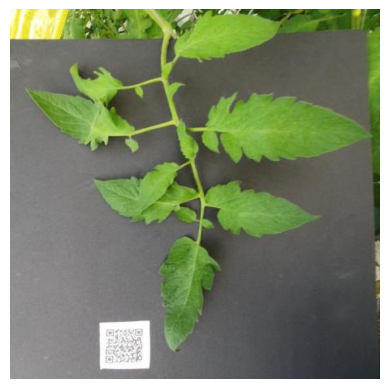

[2.0, 0.5827973484992981, 0.49494442343711853, 0.49510112404823303, 0.6475450992584229, 0.6851035356521606]
[2.0, 0.43033814430236816, 0.7893008589744568, 0.2294277548789978, 0.2928626239299774, 0.3108092248439789]


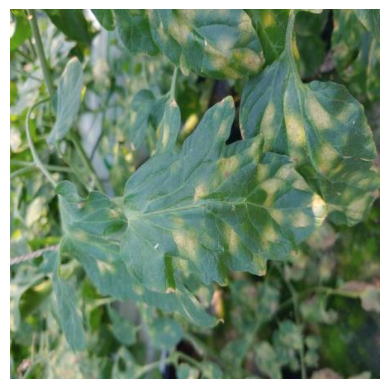

[2.0, 0.8087060451507568, 0.33858349919319153, 0.35146278142929077, 0.15002712607383728, 0.14377109706401825]
[0.0, 0.5835967063903809, 0.6922335028648376, 0.6028030514717102, 0.34116002917289734, 0.23122379183769226]
[0.0, 0.5575101971626282, 0.1140574961900711, 0.9161517024040222, 0.21788915991783142, 0.17113783955574036]
[2.0, 0.5114124417304993, 0.4846290647983551, 0.46592167019844055, 0.40542861819267273, 0.37053626775741577]
[1.0, 0.46740099787712097, 0.10939881205558777, 0.562323808670044, 0.13628868758678436, 0.15191148221492767]


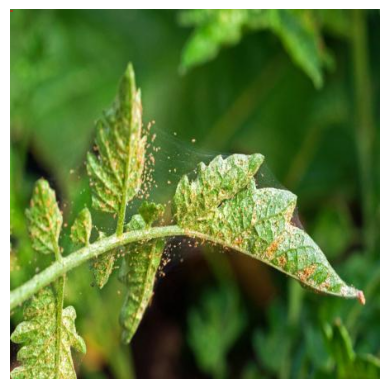

[2.0, 1.080121636390686, 0.5341209769248962, 0.49238452315330505, 1.0342849493026733, 1.1321449279785156]


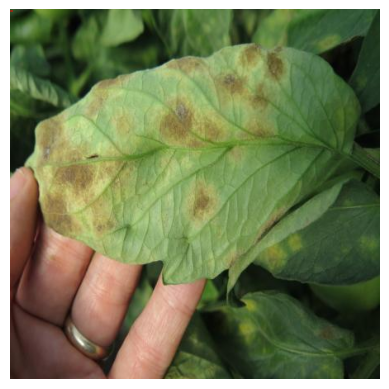

[0.0, 0.4312621057033539, 0.5300012826919556, 0.3710145354270935, 0.5215443968772888, 0.5737441182136536]


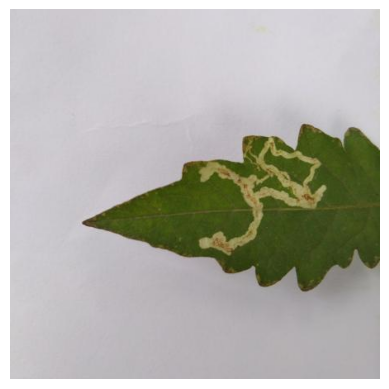

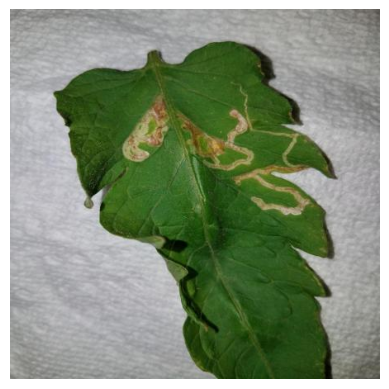

[1.0, 0.5600175857543945, 0.5379042625427246, 0.44830814003944397, 0.6276370286941528, 0.7370833158493042]
[0.0, 0.5549930930137634, 0.5310955047607422, 0.5447490215301514, 0.6866223812103271, 0.8442263007164001]


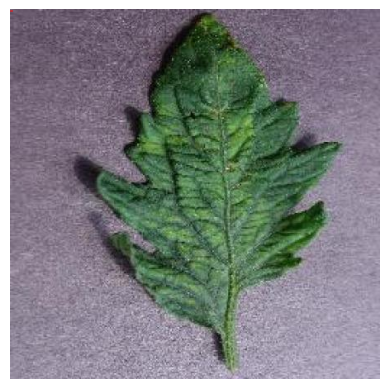

[2.0, 1.0820904970169067, 0.750580370426178, 0.7475496530532837, 0.335542768239975, 0.1876973807811737]
[2.0, 0.9739506244659424, 0.25440341234207153, 0.26286226511001587, 0.22450251877307892, 0.30090752243995667]
[0.0, 0.8949037194252014, 0.7547690272331238, 0.22627951204776764, 0.3469720184803009, 0.3387996256351471]
[0.0, 0.8733634948730469, 0.24031402170658112, 0.7390618920326233, 0.3173617124557495, 0.32531142234802246]


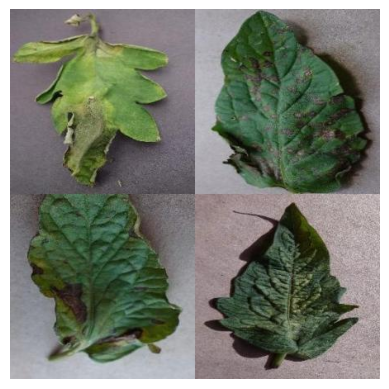

[2.0, 1.155828595161438, 0.7628069519996643, 0.7715102434158325, 0.2529868483543396, 0.3632439970970154]
[2.0, 1.0772197246551514, 0.26654645800590515, 0.2599102556705475, 0.24719186127185822, 0.3164346218109131]
[2.0, 1.035983681678772, 0.2239353358745575, 0.7670234441757202, 0.22927838563919067, 0.3558354079723358]
[2.0, 0.9575169682502747, 0.7590159177780151, 0.25426122546195984, 0.22015421092510223, 0.3423548638820648]


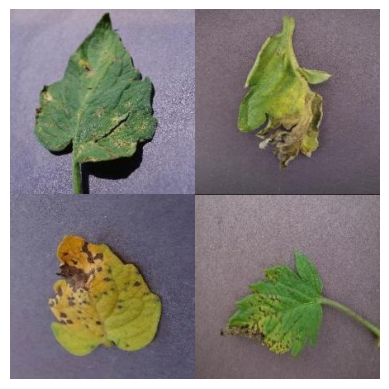

[2.0, 0.6244211792945862, 0.4894620180130005, 0.5571457743644714, 0.5850894451141357, 0.7272220849990845]


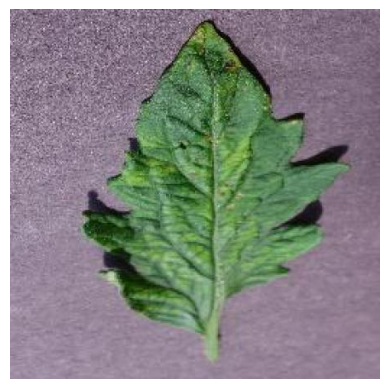

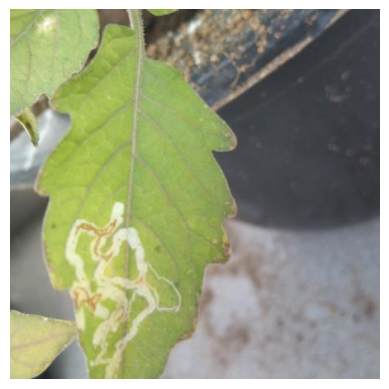

[2.0, 0.6550662517547607, 0.6937901377677917, 0.3754180371761322, 0.2390582114458084, 0.16800281405448914]
[1.0, 0.554350733757019, 0.3499388098716736, 0.48289263248443604, 0.25051480531692505, 0.23850369453430176]
[0.0, 0.5069029927253723, 0.22822408378124237, 0.40926820039749146, 0.14762482047080994, 0.2320549041032791]
[1.0, 0.47448450326919556, 0.7962350249290466, 0.496809720993042, 0.18558384478092194, 0.20721061527729034]
[0.0, 0.47162848711013794, 0.24968451261520386, 0.6881965398788452, 0.17268194258213043, 0.24631434679031372]
[0.0, 0.435989648103714, 0.517170786857605, 0.4631054699420929, 0.21945720911026, 0.24256904423236847]
[2.0, 0.40549972653388977, 0.5047271847724915, 0.6314307451248169, 0.18767651915550232, 0.2845553159713745]
[1.0, 0.4003622829914093, 0.7728533148765564, 0.3909522593021393, 0.26720666885375977, 0.20072613656520844]


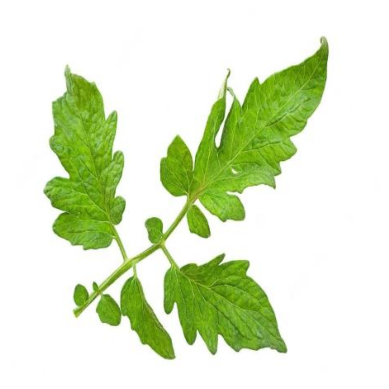

[0.0, 0.9695523381233215, 0.49607956409454346, 0.48400452733039856, 0.8572336435317993, 0.9776530265808105]


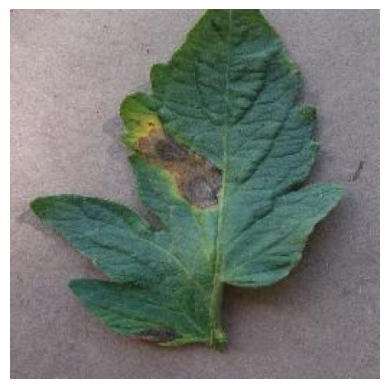

[2.0, 0.8918179273605347, 0.25474733114242554, 0.27251023054122925, 0.39647048711776733, 0.3234386146068573]
[2.0, 0.8098579049110413, 0.7612737417221069, 0.7526289820671082, 0.259133517742157, 0.3519137501716614]
[0.0, 0.6100031733512878, 0.24035172164440155, 0.7425438761711121, 0.2809780240058899, 0.3717038333415985]
[0.0, 0.5909525752067566, 0.7788631319999695, 0.2784988284111023, 0.3781246244907379, 0.4243934750556946]


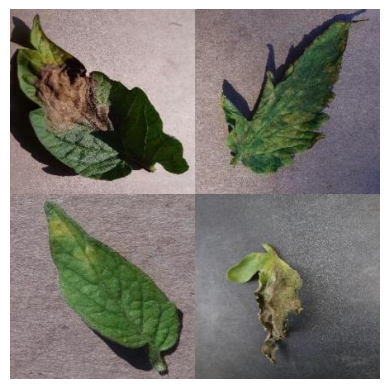

[2.0, 0.6647986769676208, 0.481147438287735, 0.5637087225914001, 1.0145083665847778, 1.048764944076538]


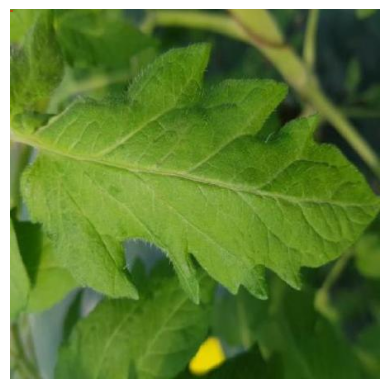

[0.0, 0.50783371925354, 0.46720650792121887, 0.5097765326499939, 0.7092309594154358, 0.7813419699668884]
[1.0, 0.46747440099716187, 0.3598437011241913, 0.5647882223129272, 0.5727399587631226, 0.7891852855682373]


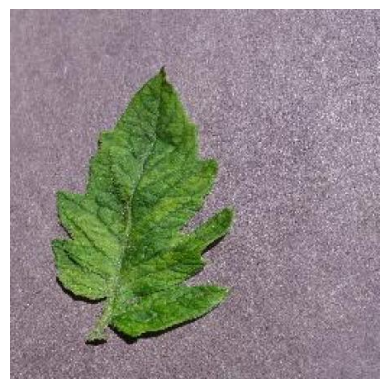

[2.0, 0.5535590052604675, 0.5283061861991882, 0.4769154191017151, 0.6877759695053101, 0.7671974897384644]
[1.0, 0.41980642080307007, 0.5057599544525146, 0.645183801651001, 0.4539823532104492, 0.5209859609603882]


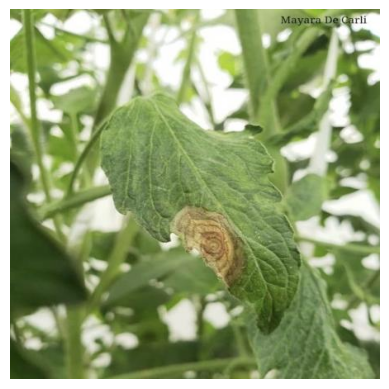

[2.0, 1.161695957183838, 0.7566488981246948, 0.7450200915336609, 0.26684796810150146, 0.1537557691335678]
[2.0, 0.8179968595504761, 0.21080593764781952, 0.28282415866851807, 0.22280459105968475, 0.29458197951316833]
[1.0, 0.7758379578590393, 0.7526311278343201, 0.23297052085399628, 0.17392264306545258, 0.30544227361679077]
[0.0, 0.762152373790741, 0.25365766882896423, 0.7399306893348694, 0.17470712959766388, 0.335613876581192]
[1.0, 0.5142897367477417, 0.7599132061004639, 0.36574068665504456, 0.21980822086334229, 0.23018909990787506]


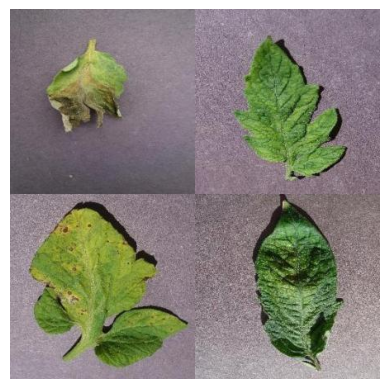

[2.0, 0.6820276379585266, 0.49584853649139404, 0.5079566836357117, 0.704289972782135, 0.5130451321601868]


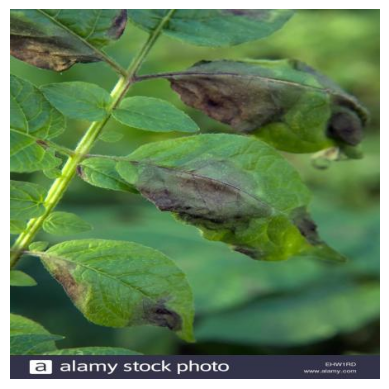

[0.0, 0.9611055254936218, 0.49024564027786255, 0.5193092823028564, 0.5777665376663208, 0.7965533137321472]


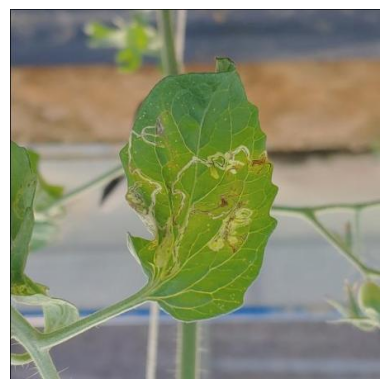

[2.0, 1.1989703178405762, 0.7703686952590942, 0.7740140557289124, 0.22179247438907623, 0.36575427651405334]
[2.0, 1.0088112354278564, 0.7750909328460693, 0.2491660863161087, 0.3460782468318939, 0.32736697793006897]
[2.0, 0.793667197227478, 0.2815237045288086, 0.2702414393424988, 0.433311402797699, 0.3957217037677765]
[2.0, 0.7526181936264038, 0.23409146070480347, 0.7649288773536682, 0.29840219020843506, 0.31189271807670593]


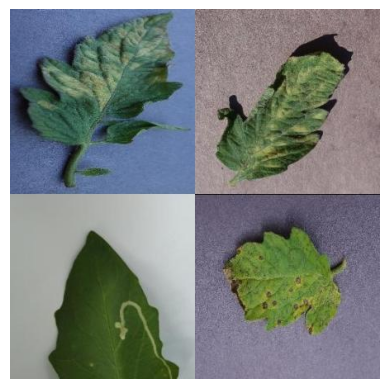

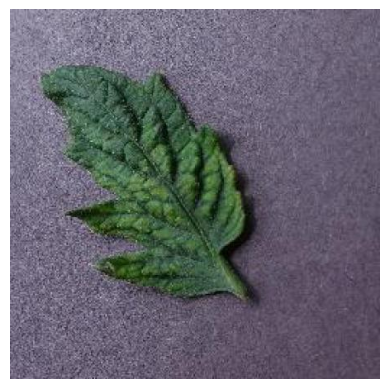

[0.0, 0.6999872922897339, 0.5168417692184448, 0.5016965270042419, 0.6466699838638306, 0.715259313583374]


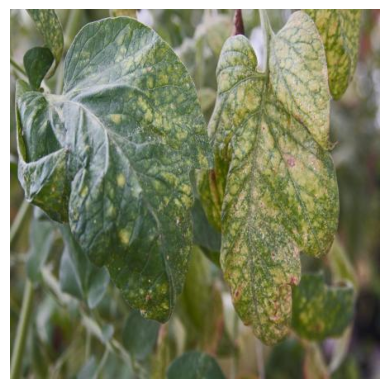

[2.0, 0.500541627407074, 0.7525503635406494, 0.36152762174606323, 0.21213394403457642, 0.20777703821659088]
[1.0, 0.49643057584762573, 0.4978705644607544, 0.6293742656707764, 0.27365580201148987, 0.3653002083301544]
[2.0, 0.4753129482269287, 0.6087639927864075, 0.5276731848716736, 0.24397385120391846, 0.3050805330276489]
[2.0, 0.4287402331829071, 0.19558750092983246, 0.783374547958374, 0.22020402550697327, 0.2994159162044525]
[2.0, 0.4186362326145172, 0.6110000014305115, 0.22119851410388947, 0.1954074501991272, 0.22877466678619385]


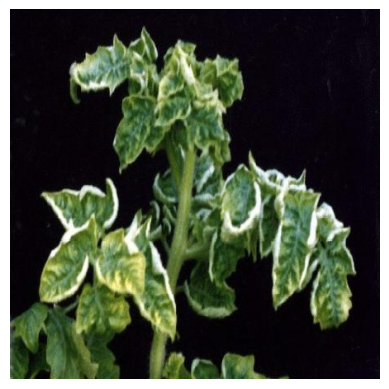

[1.0, 0.5803627371788025, 0.2261515110731125, 0.6495472192764282, 0.2858632802963257, 0.3937629759311676]
[0.0, 0.5774928331375122, 0.7896645069122314, 0.7938953638076782, 0.22945334017276764, 0.4374602735042572]
[1.0, 0.5054821968078613, 0.20596541464328766, 0.2538755536079407, 0.2880111336708069, 0.3118843138217926]
[0.0, 0.45781055092811584, 0.39827293157577515, 0.4938145577907562, 0.324085533618927, 0.3970899283885956]
[2.0, 0.45210421085357666, 0.5570856332778931, 0.38225671648979187, 0.39314112067222595, 0.45922672748565674]
[1.0, 0.42268288135528564, 0.6283273696899414, 0.5025501847267151, 0.34471648931503296, 0.46452033519744873]


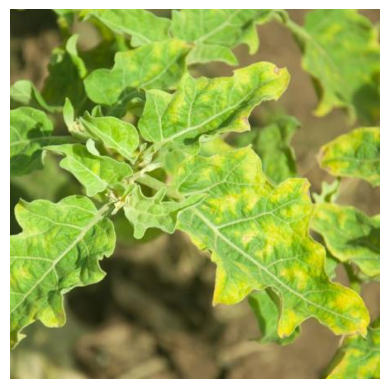

[2.0, 1.0418026447296143, 0.46742570400238037, 0.5644477009773254, 0.5578078627586365, 0.6751028299331665]


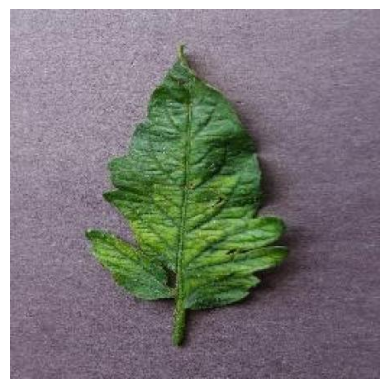

[0.0, 0.7640599608421326, 0.485361248254776, 0.5430377721786499, 0.9602645635604858, 1.165612816810608]


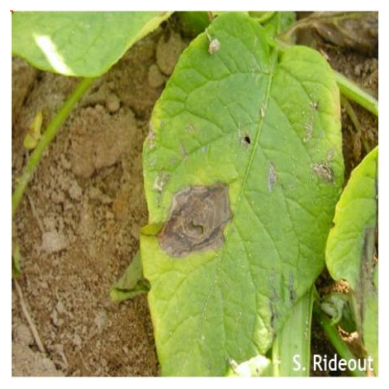

[0.0, 0.605947732925415, 0.5085414052009583, 0.48119187355041504, 0.7752615809440613, 0.856610894203186]


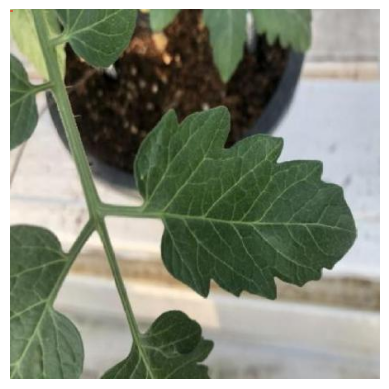

[0.0, 0.8728216290473938, 0.19564849138259888, 0.6986499428749084, 0.2289981245994568, 0.27474769949913025]
[0.0, 0.6627108454704285, 0.4665057063102722, 0.5181045532226562, 0.4088743031024933, 0.31496214866638184]
[1.0, 0.6314312815666199, 0.7722307443618774, 0.3479766249656677, 0.3011387884616852, 0.2594236135482788]
[0.0, 0.5787426233291626, 0.2292453944683075, 0.4862891733646393, 0.1997998058795929, 0.1690613478422165]
[1.0, 0.4486216902732849, 0.6412875056266785, 0.3561435639858246, 0.22761878371238708, 0.24025972187519073]
[0.0, 0.40705153346061707, 0.24288798868656158, 0.3300710916519165, 0.2820955216884613, 0.3326302766799927]


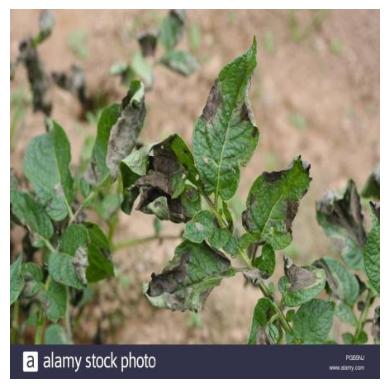

[2.0, 0.8611913323402405, 0.7503605484962463, 0.22826199233531952, 0.3120845854282379, 0.38414204120635986]
[2.0, 0.8329848051071167, 0.27702778577804565, 0.23671028017997742, 0.3099293112754822, 0.20035620033740997]
[1.0, 0.7652088403701782, 0.7291351556777954, 0.8232900500297546, 0.2599484324455261, 0.2651299238204956]
[2.0, 0.7175313830375671, 0.25585782527923584, 0.8161847591400146, 0.2907525897026062, 0.36907920241355896]


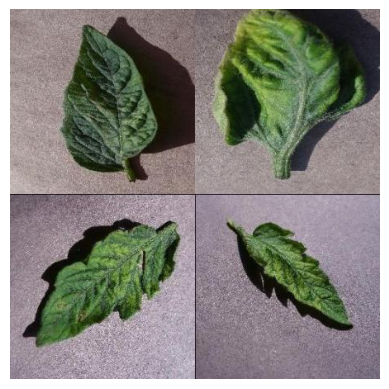

KeyboardInterrupt: 

In [ ]:
pred_boxes, _ = get_bboxes(valid_loader, model, iou_threshold=0.5, threshold=0.4, show_results=True)

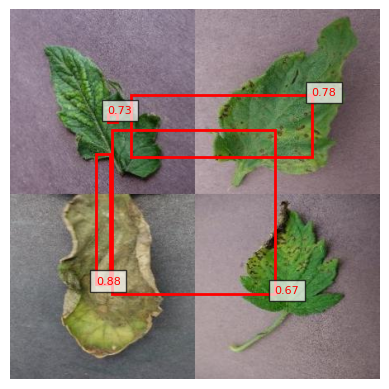

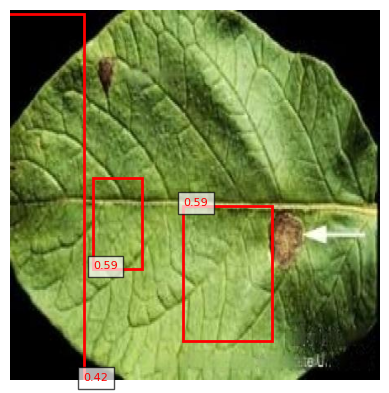

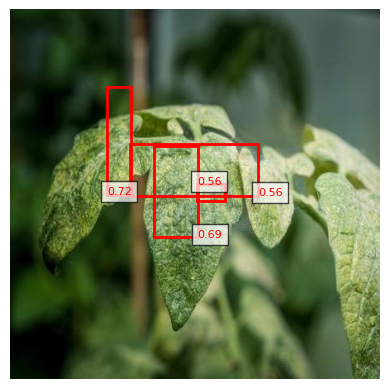

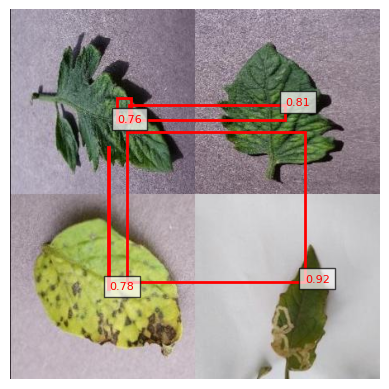

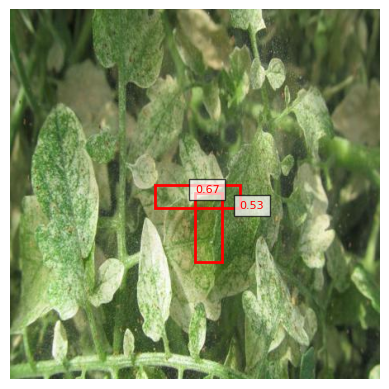

...

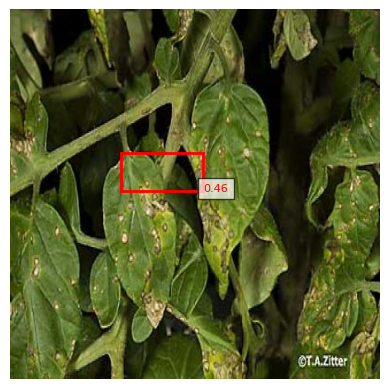

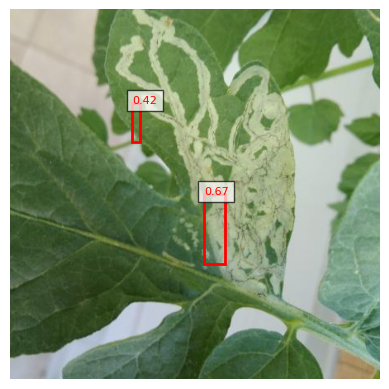

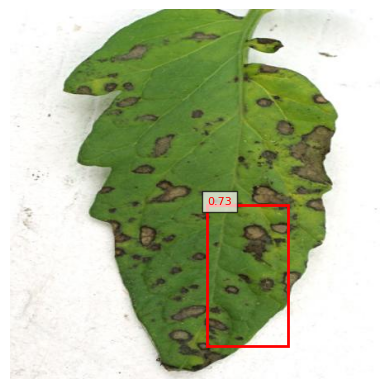

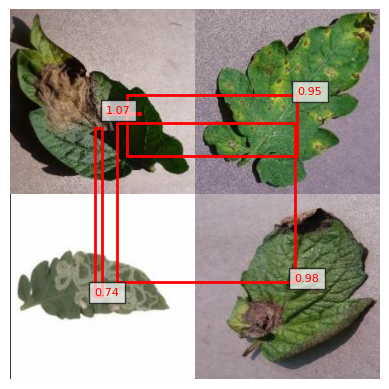

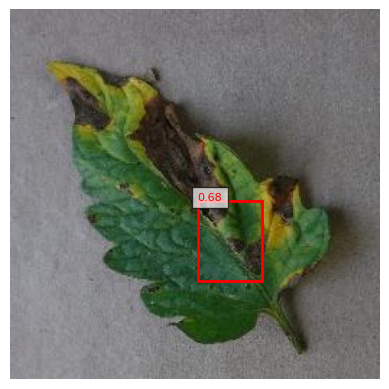

In [ ]:
import matplotlib.pyplot as plt

def get_bboxes(
    loader,
    model,
    iou_threshold,
    threshold,
    pred_format="cells",
    box_format="midpoint",
    device="cuda",
    show_results=False,
    number_of_images_to_show=40
):
    all_pred_boxes = []
    all_true_boxes = []

    model.eval()
    train_idx = 0

    for batch_idx, (x, labels) in enumerate(loader):
        if number_of_images_to_show <= 0:
          break
        x = x.to(device)
        labels = labels.to(device)

        with torch.no_grad():
            predictions = model(x)

        batch_size = x.shape[0]
        true_bboxes = cellboxes_to_boxes(labels)
        bboxes = cellboxes_to_boxes(predictions)

        for idx in range(batch_size):
            nms_boxes = non_max_suppression(
                bboxes[idx],
                iou_threshold=iou_threshold,
                threshold=threshold,
                box_format=box_format,
            )

            if show_results:
                image = x[idx].permute(1, 2, 0).to("cpu").numpy()
                plt.figure()
                plt.imshow(image)
                current_ax = plt.gca()

                # Get actual image size
                img_height, img_width, _ = image.shape

                for box in nms_boxes:
                    class_name, confidence, x1, y1, x2, y2 = box
                    # Scale the coordinates to match the actual image size
                    x1 *= img_width
                    x2 *= img_width
                    y1 *= img_height
                    y2 *= img_height

                    box_width = x2 - x1
                    box_height = y2 - y1
                    current_ax.add_patch(plt.Rectangle((x1, y1), box_width, box_height, fill=False, edgecolor='r', linewidth=2))
                    # Annotate confidence
                    plt.text(x1, y1, f'{confidence:.2f}', color='r', fontsize=8, bbox=dict(facecolor='white', alpha=0.7))
                plt.axis('off')
                plt.show()

                number_of_images_to_show -= BATCH_SIZE

            for nms_box in nms_boxes:
                all_pred_boxes.append([train_idx] + nms_box)

            for box in true_bboxes[idx]:
                if box[1] > threshold:
                    all_true_boxes.append([train_idx] + box)

            train_idx += 1

    model.train()
    return all_pred_boxes, all_true_boxes

pred_boxes, _ = get_bboxes(valid_loader, model, iou_threshold=0.5, threshold=0.4, show_results=True)
